In [303]:
#please check the link : https://www.youtube.com/watch?v=I7cDu6IaN7c


In [80]:
import pandas as pd 
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sb

from sklearn.model_selection import train_test_split

from sklearn.preprocessing import StandardScaler

from sklearn.metrics import confusion_matrix, f1_score, accuracy_score, roc_auc_score, roc_curve, classification_report

from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC
from sklearn.neighbors import KNeighborsClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier, AdaBoostClassifier
from xgboost import XGBClassifier, XGBRFClassifier
from sklearn.naive_bayes import MultinomialNB, BernoulliNB, GaussianNB


from sklearn.model_selection import RandomizedSearchCV, GridSearchCV, cross_val_score


from sklearn.datasets import load_breast_cancer

## Pickle
import pickle
import joblib

# Load  the data


In [9]:

cancer_dataset1 = load_breast_cancer
cancer_dataset = load_breast_cancer()

# Data Manupulation

In [10]:
print(cancer_dataset1)
print(cancer_dataset)

<function load_breast_cancer at 0x000001B9C5B30268>
{'data': array([[1.799e+01, 1.038e+01, 1.228e+02, ..., 2.654e-01, 4.601e-01,
        1.189e-01],
       [2.057e+01, 1.777e+01, 1.329e+02, ..., 1.860e-01, 2.750e-01,
        8.902e-02],
       [1.969e+01, 2.125e+01, 1.300e+02, ..., 2.430e-01, 3.613e-01,
        8.758e-02],
       ...,
       [1.660e+01, 2.808e+01, 1.083e+02, ..., 1.418e-01, 2.218e-01,
        7.820e-02],
       [2.060e+01, 2.933e+01, 1.401e+02, ..., 2.650e-01, 4.087e-01,
        1.240e-01],
       [7.760e+00, 2.454e+01, 4.792e+01, ..., 0.000e+00, 2.871e-01,
        7.039e-02]]), 'target': array([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0,
       0, 0, 1, 0, 1, 1, 1, 1, 1, 0, 0, 1, 0, 0, 1, 1, 1, 1, 0, 1, 0, 0,
       1, 1, 1, 1, 0, 1, 0, 0, 1, 0, 1, 0, 0, 1, 1, 1, 0, 0, 1, 0, 0, 0,
       1, 1, 1, 0, 1, 1, 0, 0, 1, 1, 1, 0, 0, 1, 1, 1, 1, 0, 1, 1, 0, 1,
       1, 1, 1, 1, 1, 

In [11]:
print(type(cancer_dataset))  
#sklearn.utils.Bunch , Bunch is same as dictionary , bunch word is use sklearn & dictionary is use in python programming

<class 'sklearn.utils.Bunch'>


In [12]:
print(cancer_dataset.keys())

dict_keys(['data', 'target', 'target_names', 'DESCR', 'feature_names', 'filename'])


In [13]:
print(type(cancer_dataset.data))
print(cancer_dataset.data.size)
print(cancer_dataset.data)

<class 'numpy.ndarray'>
17070
[[1.799e+01 1.038e+01 1.228e+02 ... 2.654e-01 4.601e-01 1.189e-01]
 [2.057e+01 1.777e+01 1.329e+02 ... 1.860e-01 2.750e-01 8.902e-02]
 [1.969e+01 2.125e+01 1.300e+02 ... 2.430e-01 3.613e-01 8.758e-02]
 ...
 [1.660e+01 2.808e+01 1.083e+02 ... 1.418e-01 2.218e-01 7.820e-02]
 [2.060e+01 2.933e+01 1.401e+02 ... 2.650e-01 4.087e-01 1.240e-01]
 [7.760e+00 2.454e+01 4.792e+01 ... 0.000e+00 2.871e-01 7.039e-02]]


In [14]:
print(type(cancer_dataset.target))
print(cancer_dataset.target.size)
print(cancer_dataset.target)

<class 'numpy.ndarray'>
569
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 1 0 0 0 0 0 0 0 0 1 0 1 1 1 1 1 0 0 1 0 0 1 1 1 1 0 1 0 0 1 1 1 1 0 1 0 0
 1 0 1 0 0 1 1 1 0 0 1 0 0 0 1 1 1 0 1 1 0 0 1 1 1 0 0 1 1 1 1 0 1 1 0 1 1
 1 1 1 1 1 1 0 0 0 1 0 0 1 1 1 0 0 1 0 1 0 0 1 0 0 1 1 0 1 1 0 1 1 1 1 0 1
 1 1 1 1 1 1 1 1 0 1 1 1 1 0 0 1 0 1 1 0 0 1 1 0 0 1 1 1 1 0 1 1 0 0 0 1 0
 1 0 1 1 1 0 1 1 0 0 1 0 0 0 0 1 0 0 0 1 0 1 0 1 1 0 1 0 0 0 0 1 1 0 0 1 1
 1 0 1 1 1 1 1 0 0 1 1 0 1 1 0 0 1 0 1 1 1 1 0 1 1 1 1 1 0 1 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 1 1 1 1 1 1 0 1 0 1 1 0 1 1 0 1 0 0 1 1 1 1 1 1 1 1 1 1 1 1
 1 0 1 1 0 1 0 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 1 1 1 0 1 0 1 1 1 1 0 0 0 1 1
 1 1 0 1 0 1 0 1 1 1 0 1 1 1 1 1 1 1 0 0 0 1 1 1 1 1 1 1 1 1 1 1 0 0 1 0 0
 0 1 0 0 1 1 1 1 1 0 1 1 1 1 1 0 1 1 1 0 1 1 0 0 1 1 1 1 1 1 0 1 1 1 1 1 1
 1 0 1 1 1 1 1 0 1 1 0 1 1 1 1 1 1 1 1 1 1 1 1 0 1 0 0 1 0 1 1 1 1 1 0 1 1
 0 1 0 1 1 0 1 0 1 1 1 1 1 1 1 1 0 0 1 1 1 1 1 1 0 1 1 1 1 1 1 1 1 1 1 0

# 'malignant' : 0 (Cancer) and  'benign' : 1 (Not Cancer)

In [15]:
print(type(cancer_dataset.target_names))
print(cancer_dataset.target_names)
print(cancer_dataset.target_names.size)


<class 'numpy.ndarray'>
['malignant' 'benign']
2


In [16]:
print(type(cancer_dataset.DESCR))
print("length : ",len(cancer_dataset.DESCR))


<class 'str'>
length :  5039


In [17]:
print(cancer_dataset.DESCR)
# :Number of Instances: 569 ->  : total no of info's are 569 (malignant and benign)
#:Number of Attributes: 30  -> : total no of feature's are 30 (numeric feature)

.. _breast_cancer_dataset:

Breast cancer wisconsin (diagnostic) dataset
--------------------------------------------

**Data Set Characteristics:**

    :Number of Instances: 569

    :Number of Attributes: 30 numeric, predictive attributes and the class

    :Attribute Information:
        - radius (mean of distances from center to points on the perimeter)
        - texture (standard deviation of gray-scale values)
        - perimeter
        - area
        - smoothness (local variation in radius lengths)
        - compactness (perimeter^2 / area - 1.0)
        - concavity (severity of concave portions of the contour)
        - concave points (number of concave portions of the contour)
        - symmetry 
        - fractal dimension ("coastline approximation" - 1)

        The mean, standard error, and "worst" or largest (mean of the three
        largest values) of these features were computed for each image,
        resulting in 30 features.  For instance, field 3 is Mean Radius, f

In [18]:
print(type(cancer_dataset.feature_names))
print(cancer_dataset.feature_names.size)
print(cancer_dataset.feature_names)

<class 'numpy.ndarray'>
30
['mean radius' 'mean texture' 'mean perimeter' 'mean area'
 'mean smoothness' 'mean compactness' 'mean concavity'
 'mean concave points' 'mean symmetry' 'mean fractal dimension'
 'radius error' 'texture error' 'perimeter error' 'area error'
 'smoothness error' 'compactness error' 'concavity error'
 'concave points error' 'symmetry error' 'fractal dimension error'
 'worst radius' 'worst texture' 'worst perimeter' 'worst area'
 'worst smoothness' 'worst compactness' 'worst concavity'
 'worst concave points' 'worst symmetry' 'worst fractal dimension']


In [19]:
print(type(cancer_dataset.filename))
print(cancer_dataset.filename) # get local csv file location

<class 'str'>
C:\Users\Rakesh Kumar\Anaconda3\lib\site-packages\sklearn\datasets\data\breast_cancer.csv


# Create a Dataframe

In [20]:
df = pd.DataFrame(np.c_[ cancer_dataset.data, cancer_dataset.target ],
                 columns=  np.append(cancer_dataset.feature_names, "Target_Output")
                 )

In [21]:
print(df.columns)

Index(['mean radius', 'mean texture', 'mean perimeter', 'mean area',
       'mean smoothness', 'mean compactness', 'mean concavity',
       'mean concave points', 'mean symmetry', 'mean fractal dimension',
       'radius error', 'texture error', 'perimeter error', 'area error',
       'smoothness error', 'compactness error', 'concavity error',
       'concave points error', 'symmetry error', 'fractal dimension error',
       'worst radius', 'worst texture', 'worst perimeter', 'worst area',
       'worst smoothness', 'worst compactness', 'worst concavity',
       'worst concave points', 'worst symmetry', 'worst fractal dimension',
       'Target_Output'],
      dtype='object')


In [22]:
print(df.shape)
print(df.size)

(569, 31)
17639


In [23]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 569 entries, 0 to 568
Data columns (total 31 columns):
mean radius                569 non-null float64
mean texture               569 non-null float64
mean perimeter             569 non-null float64
mean area                  569 non-null float64
mean smoothness            569 non-null float64
mean compactness           569 non-null float64
mean concavity             569 non-null float64
mean concave points        569 non-null float64
mean symmetry              569 non-null float64
mean fractal dimension     569 non-null float64
radius error               569 non-null float64
texture error              569 non-null float64
perimeter error            569 non-null float64
area error                 569 non-null float64
smoothness error           569 non-null float64
compactness error          569 non-null float64
concavity error            569 non-null float64
concave points error       569 non-null float64
symmetry error             569 

In [24]:
df.to_csv("Breast_Cancer_original_Dataset.csv")

In [25]:
df.head(5)

,mean radius,mean texture,mean perimeter,mean area,mean smoothness,mean compactness,mean concavity,mean concave points,mean symmetry,mean fractal dimension,...,worst texture,worst perimeter,worst area,worst smoothness,worst compactness,worst concavity,worst concave points,worst symmetry,worst fractal dimension,Target_Output
0,17.99,10.38,122.80,1001.0,0.11840,0.27760,0.3001,0.14710,0.2419,0.07871,...,17.33,184.60,2019.0,0.1622,0.6656,0.7119,0.2654,0.4601,0.11890,0.0
1,20.57,17.77,132.90,1326.0,0.08474,0.07864,0.0869,0.07017,0.1812,0.05667,...,23.41,158.80,1956.0,0.1238,0.1866,0.2416,0.1860,0.2750,0.08902,0.0
2,19.69,21.25,130.00,1203.0,0.10960,0.15990,0.1974,0.12790,0.2069,0.05999,...,25.53,152.50,1709.0,0.1444,0.4245,0.4504,0.2430,0.3613,0.08758,0.0
3,11.42,20.38,77.58,386.1,0.14250,0.28390,0.2414,0.10520,0.2597,0.09744,...,26.50,98.87,567.7,0.2098,0.8663,0.6869,0.2575,0.6638,0.17300,0.0
4,20.29,14.34,135.10,1297.0,0.10030,0.13280,0.1980,0.10430,0.1809,0.05883,...,16.67,152.20,1575.0,0.1374,0.2050,0.4000,0.1625,0.2364,0.07678,0.0


In [26]:
df.describe()

,mean radius,mean texture,mean perimeter,mean area,mean smoothness,mean compactness,mean concavity,mean concave points,mean symmetry,mean fractal dimension,...,worst texture,worst perimeter,worst area,worst smoothness,worst compactness,worst concavity,worst concave points,worst symmetry,worst fractal dimension,Target_Output
count,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,...,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000
mean,14.127292,19.289649,91.969033,654.889104,0.096360,0.104341,0.088799,0.048919,0.181162,0.062798,...,25.677223,107.261213,880.583128,0.132369,0.254265,0.272188,0.114606,0.290076,0.083946,0.627417
std,3.524049,4.301036,24.298981,351.914129,0.014064,0.052813,0.079720,0.038803,0.027414,0.007060,...,6.146258,33.602542,569.356993,0.022832,0.157336,0.208624,0.065732,0.061867,0.018061,0.483918
min,6.981000,9.710000,43.790000,143.500000,0.052630,0.019380,0.000000,0.000000,0.106000,0.049960,...,12.020000,50.410000,185.200000,0.071170,0.027290,0.000000,0.000000,0.156500,0.055040,0.000000
25%,11.700000,16.170000,75.170000,420.300000,0.086370,0.064920,0.029560,0.020310,0.161900,0.057700,...,21.080000,84.110000,515.300000,0.116600,0.147200,0.114500,0.064930,0.250400,0.071460,0.000000
50%,13.370000,18.840000,86.240000,551.100000,0.095870,0.092630,0.061540,0.033500,0.179200,0.061540,...,25.410000,97.660000,686.500000,0.131300,0.211900,0.226700,0.099930,0.282200,0.080040,1.000000
75%,15.780000,21.800000,104.100000,782.700000,0.105300,0.130400,0.130700,0.074000,0.195700,0.066120,...,29.720000,125.400000,1084.000000,0.146000,0.339100,0.382900,0.161400,0.317900,0.092080,1.000000
max,28.110000,39.280000,188.500000,2501.000000,0.163400,0.345400,0.426800,0.201200,0.304000,0.097440,...,49.540000,251.200000,4254.000000,0.222600,1.058000,1.252000,0.291000,0.663800,0.207500,1.000000


In [27]:
print(type(df))

<class 'pandas.core.frame.DataFrame'>


In [28]:
df.isnull().sum()

mean radius                0
mean texture               0
mean perimeter             0
mean area                  0
mean smoothness            0
mean compactness           0
mean concavity             0
mean concave points        0
mean symmetry              0
mean fractal dimension     0
radius error               0
texture error              0
perimeter error            0
area error                 0
smoothness error           0
compactness error          0
concavity error            0
concave points error       0
symmetry error             0
fractal dimension error    0
worst radius               0
worst texture              0
worst perimeter            0
worst area                 0
worst smoothness           0
worst compactness          0
worst concavity            0
worst concave points       0
worst symmetry             0
worst fractal dimension    0
Target_Output              0
dtype: int64

# Data Visualization

C:\Users\Rakesh Kumar\Anaconda3\lib\site-packages\statsmodels\nonparametric\kde.py:487: RuntimeWarning: invalid value encountered in true_divide
  binned = fast_linbin(X, a, b, gridsize) / (delta * nobs)
C:\Users\Rakesh Kumar\Anaconda3\lib\site-packages\statsmodels\nonparametric\kdetools.py:34: RuntimeWarning: invalid value encountered in double_scalars
  FAC1 = 2*(np.pi*bw/RANGE)**2


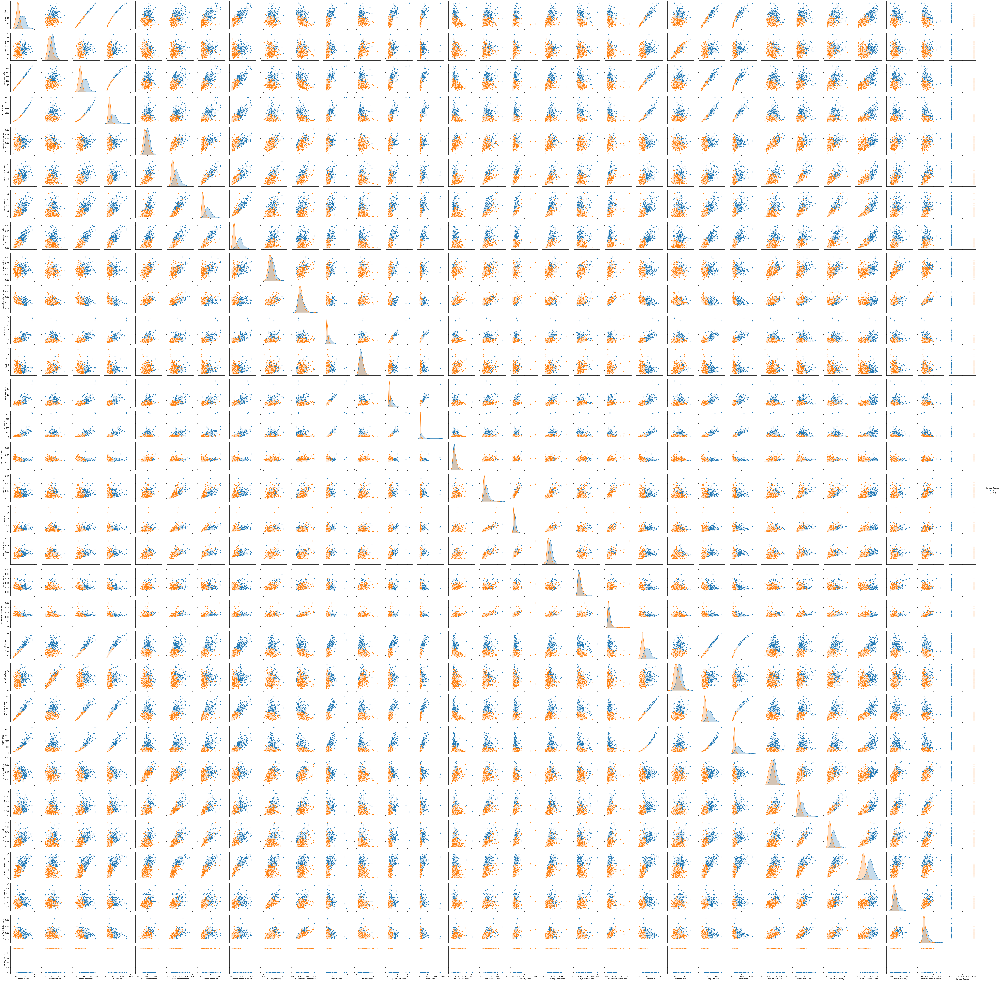

In [29]:
#pairplot of cancer dataframe
sb.pairplot(df, hue = "Target_Output")
plt.show()

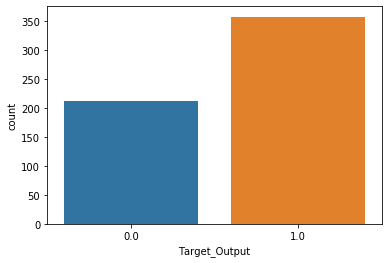

In [30]:
#Check class : types of prediction
sb.countplot(df["Target_Output"])

# In the below counterplot max samples mean radius is equal to 1.

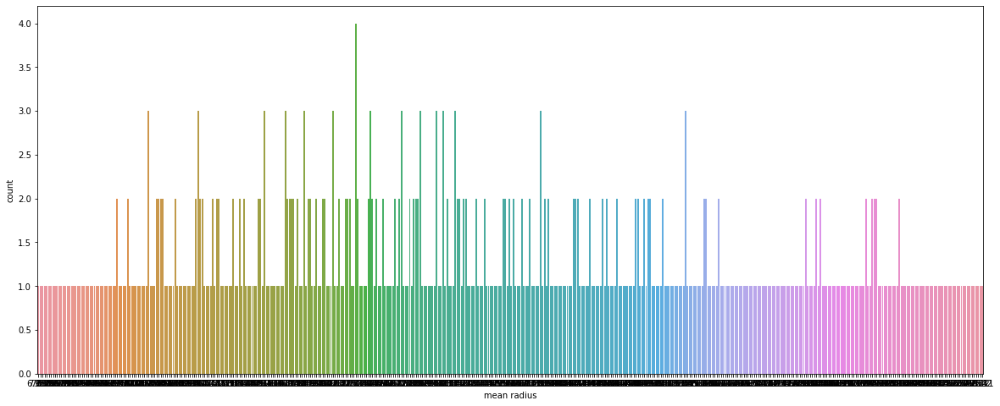

In [31]:
# counter plot of feature mean radius

plt.figure(figsize= (20,8))
sb.countplot(df["mean radius"] )
#df.mean radius : get error

# Heatmap
Heatmap of breast cancer DataFrame
In the below heatmap we can see the variety of different feature’s value. The value of feature ‘mean area’ and ‘worst area’ are greater than other and ‘mean perimeter’, ‘area error’, and ‘worst perimeter’ value slightly less but greater than remaining features.

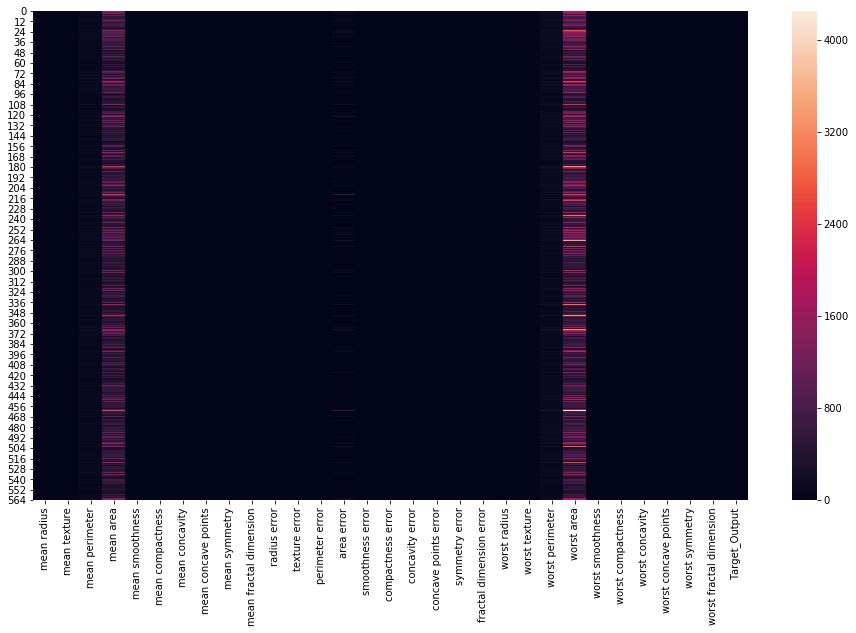

In [32]:
plt.figure(figsize=(16,9))
sb.heatmap(df)
plt.show()

# Heatmap of a correlation matrix
To find a correlation between each feature and target we visualize heatmap using the correlation matrix.

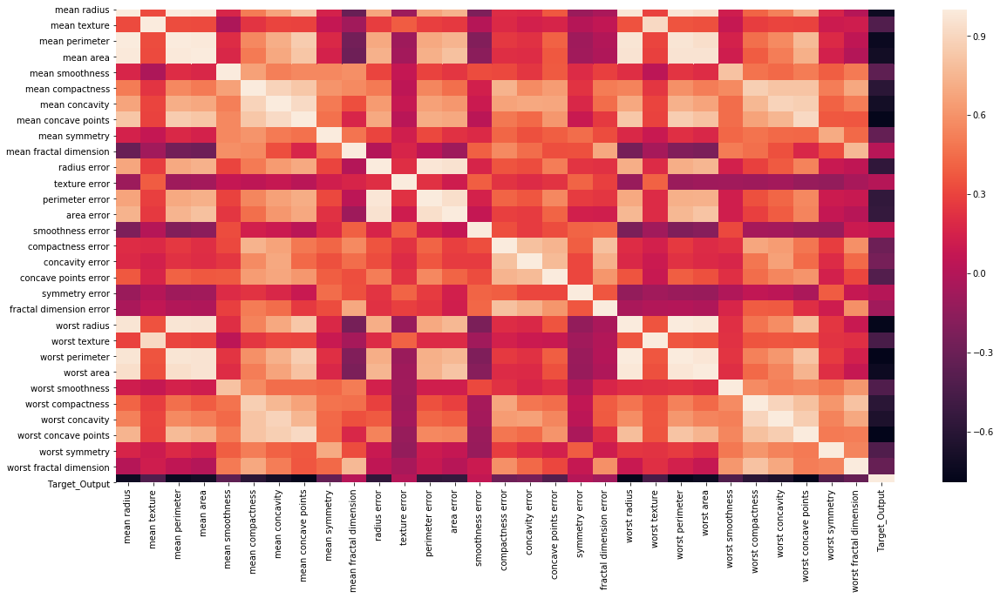

In [33]:
# Heatmap of Correlation matrix of breast cancer DataFrame
plt.figure(figsize=(20,10))
sb.heatmap(df.corr())

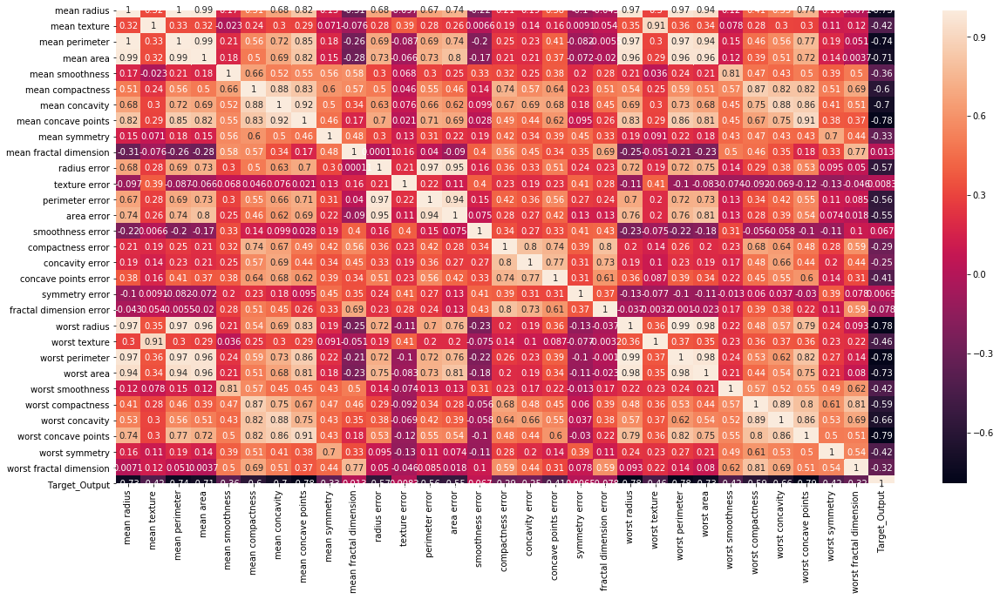

In [34]:
plt.figure(figsize=(20,10))
sb.heatmap(df.corr(), annot=True)
plt.show()

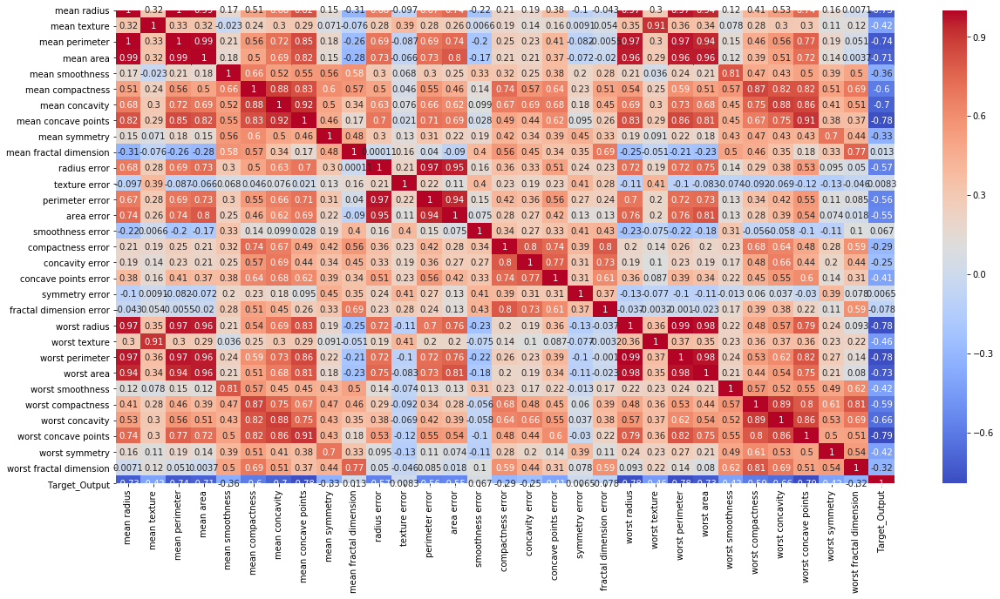

In [35]:
plt.figure(figsize=(20,10))
sb.heatmap(df.corr(), annot=True, cmap="coolwarm")
plt.show()

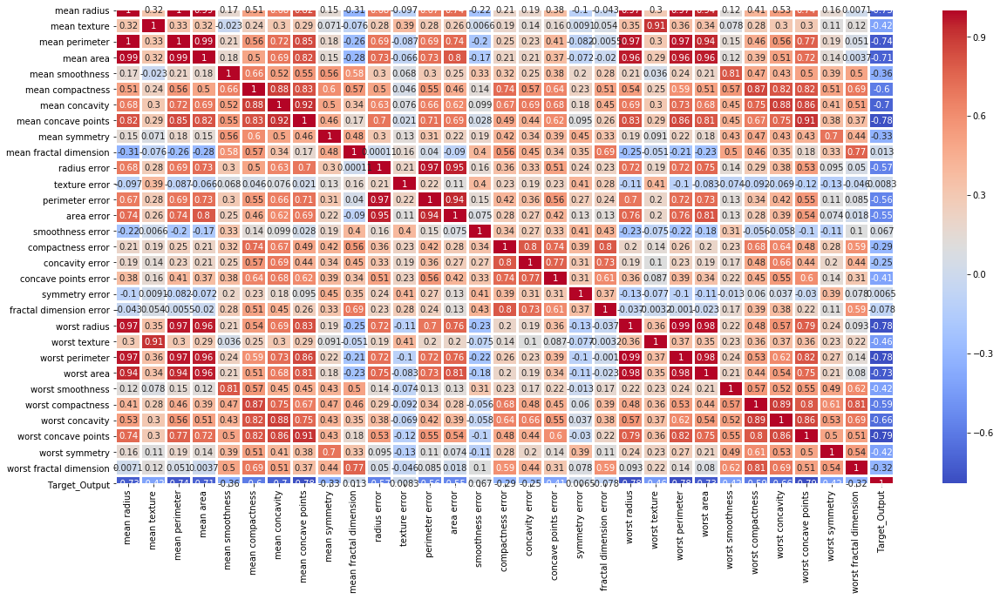

In [36]:
plt.figure(figsize=(20,10))
sb.heatmap(df.corr(), annot=True, cmap="coolwarm", linewidths=2)
plt.show()

# Correlation barplot
Taking the correlation of each feature with the target and the visualize barplot.

In [37]:
# create second DataFrame by droping target
print("before The shape of 'cancer_df2' is : ", df.shape)
df2 = df.drop(["Target_Output"] , axis = 1)
print("The shape of 'cancer_df2' is        : ", df2.shape)

before The shape of 'cancer_df2' is :  (569, 31)
The shape of 'cancer_df2' is        :  (569, 30)


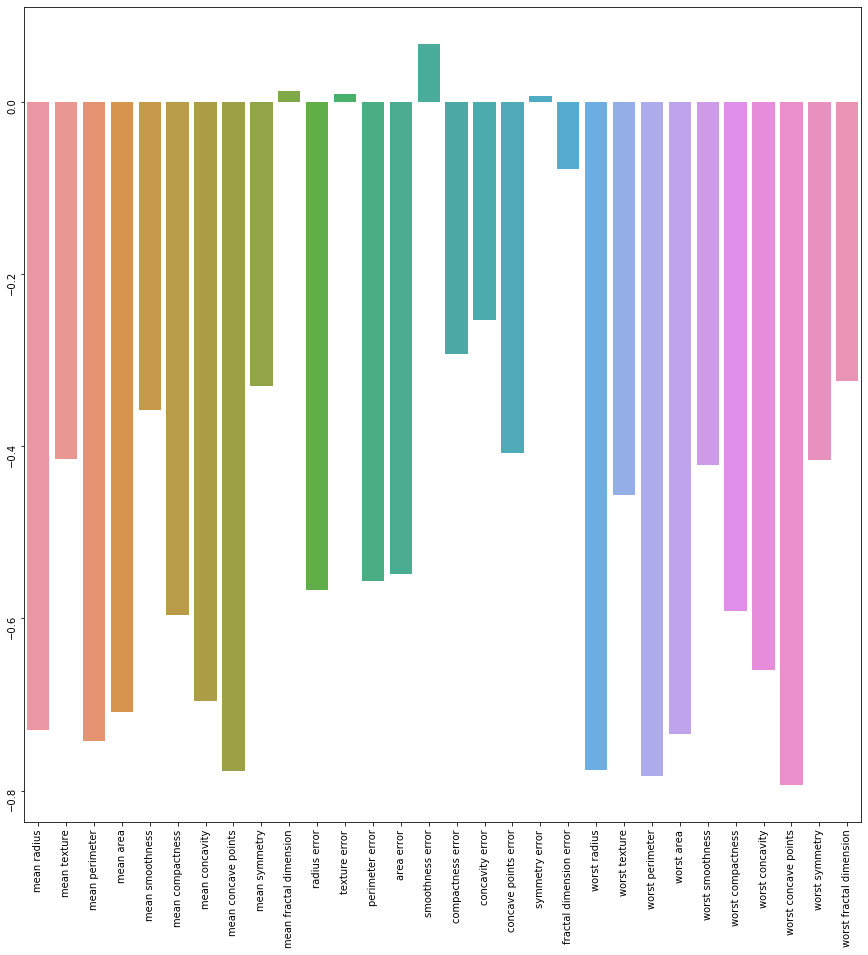

In [38]:
# visualize correlation barplot
plt.figure(figsize=(15, 15))
ax = sb.barplot(df2.corrwith(df.Target_Output).index, df2.corrwith(df.Target_Output))
ax.tick_params(labelrotation = 90)

#features ‘mean factor dimension’, ‘texture error’,‘symmetry error’ are very less positive correlated ,, so we can delete that 
#feature, bcoz there are not more correlated to each other(very less correlation)

In the above correlation barplot only feature ‘smoothness error’ is strongly positively correlated with the target than others. The features ‘mean factor dimension’, ‘texture error’, and ‘symmetry error’ are very less positive correlated and others remaining are strongly negatively correlated.

# Data Preprocessing
Split DataFrame in train and test

In [39]:
# X = df.drop(["Target_Output"] , axis = 1)  # or
X = df.loc[:, : "Target_Output"] # or df.iloc[:,: -1]
print(X.shape)
print(type(X))
print("*"*90)
print(X.columns)

# print(X.describe())

# print(X.info())
print("*"*90)

X.head(2)

(569, 31)
<class 'pandas.core.frame.DataFrame'>
******************************************************************************************
Index(['mean radius', 'mean texture', 'mean perimeter', 'mean area',
       'mean smoothness', 'mean compactness', 'mean concavity',
       'mean concave points', 'mean symmetry', 'mean fractal dimension',
       'radius error', 'texture error', 'perimeter error', 'area error',
       'smoothness error', 'compactness error', 'concavity error',
       'concave points error', 'symmetry error', 'fractal dimension error',
       'worst radius', 'worst texture', 'worst perimeter', 'worst area',
       'worst smoothness', 'worst compactness', 'worst concavity',
       'worst concave points', 'worst symmetry', 'worst fractal dimension',
       'Target_Output'],
      dtype='object')
******************************************************************************************


,mean radius,mean texture,mean perimeter,mean area,mean smoothness,mean compactness,mean concavity,mean concave points,mean symmetry,mean fractal dimension,...,worst texture,worst perimeter,worst area,worst smoothness,worst compactness,worst concavity,worst concave points,worst symmetry,worst fractal dimension,Target_Output
0,17.99,10.38,122.8,1001.0,0.11840,0.27760,0.3001,0.14710,0.2419,0.07871,...,17.33,184.6,2019.0,0.1622,0.6656,0.7119,0.2654,0.4601,0.11890,0.0
1,20.57,17.77,132.9,1326.0,0.08474,0.07864,0.0869,0.07017,0.1812,0.05667,...,23.41,158.8,1956.0,0.1238,0.1866,0.2416,0.1860,0.2750,0.08902,0.0


In [40]:
Y = df.loc[:,"Target_Output"]
print(type(Y))
print(Y.shape)
print(Y.head(5))
print("*"*120)
# print(Y.info) # error, it is not possible in series
# print(Y.columns) # error, it is not possible in series

print(Y.describe)

<class 'pandas.core.series.Series'>
(569,)
0    0.0
1    0.0
2    0.0
3    0.0
4    0.0
Name: Target_Output, dtype: float64
************************************************************************************************************************
<bound method NDFrame.describe of 0      0.0
1      0.0
2      0.0
3      0.0
4      0.0
      ... 
564    0.0
565    0.0
566    0.0
567    0.0
568    1.0
Name: Target_Output, Length: 569, dtype: float64>


In [41]:
X_train, X_test, Y_train, Y_test = train_test_split(X, Y, random_state = 2, test_size = 0.25)

In [42]:
print(X_train.shape)
print(X_test.shape)

print(Y_train.shape)
print(Y_test.shape)

(426, 31)
(143, 31)
(426,)
(143,)


In [43]:
print(type(X_train.shape))
print(type(X_test.shape))

print(type(Y_train.shape))
print(type(Y_test.shape))

<class 'tuple'>
<class 'tuple'>
<class 'tuple'>
<class 'tuple'>


In [44]:
X_train.head(2)

,mean radius,mean texture,mean perimeter,mean area,mean smoothness,mean compactness,mean concavity,mean concave points,mean symmetry,mean fractal dimension,...,worst texture,worst perimeter,worst area,worst smoothness,worst compactness,worst concavity,worst concave points,worst symmetry,worst fractal dimension,Target_Output
489,16.69,20.20,107.1,857.6,0.07497,0.07112,0.03649,0.02307,0.1846,0.05325,...,26.56,127.3,1084.0,0.1009,0.2920,0.2477,0.08737,0.4677,0.07623,0.0
194,14.86,23.21,100.4,671.4,0.10440,0.19800,0.16970,0.08878,0.1737,0.06672,...,27.78,118.6,784.7,0.1316,0.4648,0.4589,0.17270,0.3000,0.08701,0.0


In [45]:
X_test.head(3)

,mean radius,mean texture,mean perimeter,mean area,mean smoothness,mean compactness,mean concavity,mean concave points,mean symmetry,mean fractal dimension,...,worst texture,worst perimeter,worst area,worst smoothness,worst compactness,worst concavity,worst concave points,worst symmetry,worst fractal dimension,Target_Output
528,13.940,13.17,90.31,594.2,0.12480,0.09755,0.10100,0.066150,0.1976,0.06457,...,15.38,94.52,653.3,0.1394,0.1364,0.15590,0.1015,0.2160,0.07253,1.0
291,14.960,19.10,97.03,687.3,0.08992,0.09823,0.05940,0.048190,0.1879,0.05852,...,26.19,109.10,809.8,0.1313,0.3030,0.18040,0.1489,0.2962,0.08472,1.0
467,9.668,18.10,61.06,286.3,0.08311,0.05428,0.01479,0.005769,0.1680,0.06412,...,24.62,71.11,380.2,0.1388,0.1255,0.06409,0.0250,0.3057,0.07875,1.0


# Feature Scaling
Converting different units and magnitude data in one unit.

In [46]:
sc = StandardScaler()

X_train_sc = sc.fit_transform(X_train)
X_test_sc = sc.transform(X_test)

In [47]:
# X_train_sc.head(3) #AttributeError: 'numpy.ndarray' object has no attribute 'head'

#X_test_sc.head(3)#AttributeError: 'numpy.ndarray' object has no attribute 'head'


# Breast Cancer Detection Machine Learning Model Building
We have clean data to build the Ml model. But which Machine learning algorithm is best for the data we have to find. The output is a categorical format so we will use supervised classification machine learning algorithms.

To build the best model, we have to train and test the dataset with multiple Machine Learning algorithms then we can find the best ML model. So let’s try.

First, we need to import the required packages.

# SVM

In [48]:
svc_classifier = SVC()
svc_classifier.fit(X_train, Y_train)
y_pred_scv = svc_classifier.predict(X_test)
print(accuracy_score(Y_test, y_pred_scv))


# Train with Standard scaled Data
svc_classifier2 = SVC()
svc_classifier2.fit(X_train_sc, Y_train)
y_pred_svc_sc = svc_classifier2.predict(X_test_sc)
print("Scaling Accuracy : ", accuracy_score(Y_test, y_pred_svc_sc))

0.6083916083916084
Scaling Accuracy :  0.993006993006993


C:\Users\Rakesh Kumar\Anaconda3\lib\site-packages\sklearn\svm\base.py:193: FutureWarning: The default value of gamma will change from 'auto' to 'scale' in version 0.22 to account better for unscaled features. Set gamma explicitly to 'auto' or 'scale' to avoid this warning.
  "avoid this warning.", FutureWarning)


# Logistic Regression

In [49]:
lr_classifier_L1 = LogisticRegression(random_state=45 ,  penalty="l1")
lr_classifier_L1.fit(X_train, Y_train)
y_pred_lr = lr_classifier_L1.predict(X_test)
print("lr_classifier_L1 : ",accuracy_score(Y_test, y_pred_lr))

lr_classifier_L2 = LogisticRegression(random_state=45 ,  penalty="l2")
lr_classifier_L2.fit(X_train, Y_train)
y_pred_lr = lr_classifier_L2.predict(X_test)
print("lr_classifier_L2 : ",accuracy_score(Y_test, y_pred_lr))

C:\Users\Rakesh Kumar\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:432: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)


lr_classifier_L1 :  1.0
lr_classifier_L2 :  0.986013986013986


C:\Users\Rakesh Kumar\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:432: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)


In [50]:
#Scaling

lr_classifier_L1_sc = LogisticRegression(random_state=45 ,  penalty="l1")
lr_classifier_L1_sc.fit(X_train_sc, Y_train)
y_pred_lr = lr_classifier_L1_sc.predict(X_test_sc)
print("lr_classifier_L1_sc : ",accuracy_score(Y_test, y_pred_lr))

lr_classifier_L2_sc = LogisticRegression(random_state=45 ,  penalty="l2")
lr_classifier_L2_sc.fit(X_train_sc, Y_train)
y_pred_lr = lr_classifier_L2_sc.predict(X_test_sc)
print("lr_classifier_L2_sc : ",accuracy_score(Y_test, y_pred_lr))

lr_classifier_L1_sc :  1.0
lr_classifier_L2_sc :  1.0


C:\Users\Rakesh Kumar\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:432: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
C:\Users\Rakesh Kumar\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:432: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)


# K – Nearest Neighbor Classifier

In [51]:
# K – Nearest Neighbor Classifier , wtiout (metric, n_neighbors, p)
knn_classifier = KNeighborsClassifier()
knn_classifier.fit(X_train, Y_train)
y_pred_knn = knn_classifier.predict(X_test)
print(accuracy_score(Y_test, y_pred_knn))


# K – Nearest Neighbor Classifier
from sklearn.neighbors import KNeighborsClassifier
knn_classifier = KNeighborsClassifier()
knn_classifier.fit(X_train_sc, Y_train)
y_pred_knn = knn_classifier.predict(X_test_sc)
print("scaling : ",accuracy_score(Y_test, y_pred_knn))

0.9230769230769231
scaling :  1.0


In [52]:
# K – Nearest Neighbor Classifier
knn_classifier = KNeighborsClassifier(n_neighbors=5, metric= "minkowski", p = 2)
knn_classifier.fit(X_train, Y_train)
y_pred_knn = knn_classifier.predict(X_test)
print(accuracy_score(Y_test, y_pred_knn))


# K – Nearest Neighbor Classifier
from sklearn.neighbors import KNeighborsClassifier
knn_classifier = KNeighborsClassifier(n_neighbors= 5 , metric= "minkowski", p = 2)
knn_classifier.fit(X_train_sc, Y_train)
y_pred_knn = knn_classifier.predict(X_test_sc)
print("scaling : ",accuracy_score(Y_test, y_pred_knn))

0.9230769230769231
scaling :  1.0


# Naive Bayes Classifier


In [53]:
# 1 GaussianNB Classifier
nb_classifier = GaussianNB()
nb_classifier.fit(X_train, Y_train)
y_pred_nb = nb_classifier.predict(X_test)
print(accuracy_score(Y_test, y_pred_nb))



# Train with Standard scaled Data
nb_classifier2 = GaussianNB()
nb_classifier2.fit(X_train_sc, Y_train)
y_pred_nb_sc = nb_classifier2.predict(X_test_sc)
print("scaling : ", accuracy_score(Y_test, y_pred_nb_sc))

1.0
scaling :  1.0


In [54]:
# 2 BernoulliNB Classifier
nb_classifier = BernoulliNB()
nb_classifier.fit(X_train, Y_train)
y_pred_nb = nb_classifier.predict(X_test)
print(accuracy_score(Y_test, y_pred_nb))



# Train with Standard scaled Data
nb_classifier2 = GaussianNB()
nb_classifier2.fit(X_train_sc, Y_train)
y_pred_nb_sc = nb_classifier2.predict(X_test_sc)
print("scaling : ", accuracy_score(Y_test, y_pred_nb_sc))

1.0
scaling :  1.0


In [55]:
# 3 MultinomialNB Classifier
nb_classifier = MultinomialNB()
nb_classifier.fit(X_train, Y_train)
y_pred_nb_MultinomialNB = nb_classifier.predict(X_test)
print(accuracy_score(Y_test, y_pred_nb_MultinomialNB))



# Train with Standard scaled Data
nb_classifier2 = GaussianNB()
nb_classifier2.fit(X_train_sc, Y_train)
y_pred_nb_sc = nb_classifier2.predict(X_test_sc)
print("scaling : ", accuracy_score(Y_test, y_pred_nb_sc))

0.9090909090909091
scaling :  1.0


# Decision Tree Classifier


In [56]:
# Decision Tree  Classifier without( criterion , random_state)
dt_classifier = DecisionTreeClassifier()
dt_classifier.fit(X_train, Y_train)
y_pred_nb = dt_classifier.predict(X_test)
print(accuracy_score(Y_test, y_pred_nb))



# Train with Standard scaled Data
dt_classifier2 = GaussianNB()
dt_classifier2.fit(X_train_sc, Y_train)
y_pred_nb_sc = dt_classifier2.predict(X_test_sc)
print("scaling : ", accuracy_score(Y_test, y_pred_nb_sc))

1.0
scaling :  1.0


In [57]:
# Decision Tree  Classifier with( criterion , random_state)
dt_classifier = DecisionTreeClassifier(criterion= "gini", random_state=51)
dt_classifier.fit(X_train, Y_train)
y_pred_nb = dt_classifier.predict(X_test)
print(accuracy_score(Y_test, y_pred_nb))



# Train with Standard scaled Data
dt_classifier2 = DecisionTreeClassifier(criterion = "gini", random_state = 51)
dt_classifier2.fit(X_train_sc, Y_train)
y_pred_nb_sc = dt_classifier2.predict(X_test_sc)
print("scaling : ", accuracy_score(Y_test, y_pred_nb_sc))

1.0
scaling :  1.0


In [58]:
# Decision Tree  Classifier with( criterion , random_state)
dt_classifier = DecisionTreeClassifier(criterion= "entropy", random_state=51)
dt_classifier.fit(X_train, Y_train)
y_pred_nb = dt_classifier.predict(X_test)
print(accuracy_score(Y_test, y_pred_nb))



# Train with Standard scaled Data
dt_classifier2 = DecisionTreeClassifier(criterion = "entropy", random_state = 51)
dt_classifier2.fit(X_train_sc, Y_train)
y_pred_nb_sc = dt_classifier2.predict(X_test_sc)
print("scaling : ", accuracy_score(Y_test, y_pred_nb_sc))

1.0
scaling :  1.0


# Random Forest Classifier


In [59]:
# Random Forest  Classifier without( criterion , n_estimators)
rf_classifier = RandomForestClassifier()
rf_classifier.fit(X_train, Y_train)
y_pred_nb = rf_classifier.predict(X_test)
print(accuracy_score(Y_test, y_pred_nb))



# Train with Standard scaled Data
rf_classifier2 = RandomForestClassifier()
rf_classifier2.fit(X_train_sc, Y_train)
y_pred_nb_sc = rf_classifier2.predict(X_test_sc)
print("scaling : ", accuracy_score(Y_test, y_pred_nb_sc))

0.9790209790209791
scaling :  0.986013986013986


C:\Users\Rakesh Kumar\Anaconda3\lib\site-packages\sklearn\ensemble\forest.py:245: FutureWarning: The default value of n_estimators will change from 10 in version 0.20 to 100 in 0.22.
  "10 in version 0.20 to 100 in 0.22.", FutureWarning)
C:\Users\Rakesh Kumar\Anaconda3\lib\site-packages\sklearn\ensemble\forest.py:245: FutureWarning: The default value of n_estimators will change from 10 in version 0.20 to 100 in 0.22.
  "10 in version 0.20 to 100 in 0.22.", FutureWarning)


# Random Forest  Classifier with( criterion , n_estimators)
rf_classifier = RandomForestClassifier(criterion= "entropy", n_estimators=20)
rf_classifier.fit(X_train, Y_train)
y_pred_nb = rf_classifier.predict(X_test)
print(accuracy_score(Y_test, y_pred_nb))



# Train with Standard scaled Data
rf_classifier2 = RandomForestClassifier(criterion= "entropy", n_estimators=20)
rf_classifier2.fit(X_train_sc, Y_train)
y_pred_nb_sc = rf_classifier2.predict(X_test_sc)
print("scaling : ", accuracy_score(Y_test, y_pred_nb_sc))

In [60]:
# Random Forest  Classifier with( criterion , n_estimators)
rf_classifier = RandomForestClassifier(criterion= "gini", n_estimators=20)
rf_classifier.fit(X_train, Y_train)
y_pred_nb = rf_classifier.predict(X_test)
print(accuracy_score(Y_test, y_pred_nb))



# Train with Standard scaled Data
rf_classifier2 = RandomForestClassifier(criterion= "gini", n_estimators=20)
rf_classifier2.fit(X_train_sc, Y_train)
y_pred_nb_sc = rf_classifier2.predict(X_test_sc)
print("scaling : ", accuracy_score(Y_test, y_pred_nb_sc))

0.993006993006993
scaling :  0.986013986013986


# Adaboost Classifier


In [61]:
# Adaboost Classifier without (cDecisionTreeClassifier(criterion = 'entropy', random_state = 200),
#n_estimators=2000, learning_rate=0.1,  algorithm='SAMME.R', random_state=1 )


adb_classifier = AdaBoostClassifier()
adb_classifier.fit(X_train, Y_train)
y_pred_adb = adb_classifier.predict(X_test)
print(accuracy_score(Y_test, y_pred_adb))


# Scaling Adaboost Classifier
adb_classifier_sc = AdaBoostClassifier()
adb_classifier_sc.fit(X_train_sc, Y_train)
y_pred_adb_sc = adb_classifier_sc.predict(X_test_sc)
print("scaling : ",accuracy_score(Y_test, y_pred_adb_sc))

1.0
scaling :  1.0


In [62]:
# Adaboost Classifier with (cDecisionTreeClassifier(criterion = 'entropy', random_state = 200),
#n_estimators=2000, learning_rate=0.1,  algorithm='SAMME.R', random_state=1 )


adb_classifier = AdaBoostClassifier(DecisionTreeClassifier(criterion = "entropy", random_state =  200),
                                   n_estimators=2000, learning_rate=0.1, algorithm="SAMME.R", random_state=1)
adb_classifier.fit(X_train, Y_train)
y_pred_adb = adb_classifier.predict(X_test)
print(accuracy_score(Y_test, y_pred_adb))


# Scaling Adaboost Classifier
adb_classifier_sc = AdaBoostClassifier(DecisionTreeClassifier(criterion = "entropy", random_state =  200),
                                   n_estimators=2000, learning_rate=0.1, algorithm="SAMME.R", random_state=1)
adb_classifier_sc.fit(X_train_sc, Y_train)
y_pred_adb_sc = adb_classifier_sc.predict(X_test_sc)
print("scaling : ",accuracy_score(Y_test, y_pred_adb_sc))

1.0
scaling :  1.0


# XGBoost Classifier

In [63]:
# XGBoost Classifier
xgb_classifier = XGBClassifier()
xgb_classifier.fit(X_train, Y_train)
y_pred_xgb = xgb_classifier.predict(X_test)
print(accuracy_score(Y_test, y_pred_xgb))

# Train with Standard scaled Data
xgb_classifier2 = XGBClassifier()
xgb_classifier2.fit(X_train_sc, Y_train)
y_pred_xgb_sc = xgb_classifier2.predict(X_test_sc)
print("Scaling : ", accuracy_score(Y_test, y_pred_xgb_sc))

1.0
Scaling :  1.0


# 2 Types of Tuning : 1) Randomized Search 2) Grid Search
a)XGBoost Parameter Tuning Randomized Search

In [64]:
# XGBoost classifier most required parameters
params = {
    "learning_rate"      :    [0.05, 0.10, 0.15, 0.20, 0.25, 0.30],
    "max_depth"          :    [3, 4, 5, 6, 8, 10, 12, 15, 19, 30],
    "min_child_weight"   :    [3, 4, 8, 11, 19],
    "gamma"              :    [0.1, 0.2, 0.3, 0.4, 0.5],
    "colsample_bytree"   :    [0.3, 0.4, 0.5, 0.8]
    
}

In [66]:
xgb_classifier = XGBClassifier()



random_search = RandomizedSearchCV(xgb_classifier, param_distributions= params, scoring= "roc_auc", n_jobs=-1, verbose=3)
random_search.fit(X_train, Y_train)

C:\Users\Rakesh Kumar\Anaconda3\lib\site-packages\sklearn\model_selection\_split.py:1978: FutureWarning: The default value of cv will change from 3 to 5 in version 0.22. Specify it explicitly to silence this warning.
  warnings.warn(CV_WARNING, FutureWarning)


Fitting 3 folds for each of 10 candidates, totalling 30 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 out of  30 | elapsed:    4.6s remaining:    0.6s
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:    4.7s finished


RandomizedSearchCV(cv='warn', error_score='raise-deprecating',
                   estimator=XGBClassifier(base_score=0.5, booster='gbtree',
                                           colsample_bylevel=1,
                                           colsample_bynode=1,
                                           colsample_bytree=1, gamma=0,
                                           learning_rate=0.1, max_delta_step=0,
                                           max_depth=3, min_child_weight=1,
                                           missing=None, n_estimators=100,
                                           n_jobs=1, nthread=None,
                                           objective='binary:logistic',
                                           random_state=0, reg_al...
                                           verbosity=1),
                   iid='warn', n_iter=10, n_jobs=-1,
                   param_distributions={'colsample_bytree': [0.3, 0.4, 0.5,
                                    

In [67]:
print("Best Params : ",random_search.best_params_)
print("Best Index : ",random_search.best_index_)
print("Best Score : ",random_search.best_score_)

print("Classees : ",random_search.classes_)

print("Error Score : ",random_search.error_score)

print("Mutimetric : ",random_search.multimetric_)


Best Params :  {'min_child_weight': 4, 'max_depth': 19, 'learning_rate': 0.1, 'gamma': 0.5, 'colsample_bytree': 0.5}
Best Index :  1
Best Score :  1.0
Classees :  [0. 1.]
Error Score :  raise-deprecating
Mutimetric :  False


In [69]:
print("Best Estimator : ",random_search.best_estimator_)


Best Estimator :  XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
              colsample_bynode=1, colsample_bytree=0.5, gamma=0.5,
              learning_rate=0.1, max_delta_step=0, max_depth=19,
              min_child_weight=4, missing=None, n_estimators=100, n_jobs=1,
              nthread=None, objective='binary:logistic', random_state=0,
              reg_alpha=0, reg_lambda=1, scale_pos_weight=1, seed=None,
              silent=None, subsample=1, verbosity=1)


In [70]:
print("Fit : ",random_search.fit)


Fit :  <bound method BaseSearchCV.fit of RandomizedSearchCV(cv='warn', error_score='raise-deprecating',
                   estimator=XGBClassifier(base_score=0.5, booster='gbtree',
                                           colsample_bylevel=1,
                                           colsample_bynode=1,
                                           colsample_bytree=1, gamma=0,
                                           learning_rate=0.1, max_delta_step=0,
                                           max_depth=3, min_child_weight=1,
                                           missing=None, n_estimators=100,
                                           n_jobs=1, nthread=None,
                                           objective='binary:logistic',
                                           random_state=0, reg_al...
                                           verbosity=1),
                   iid='warn', n_iter=10, n_jobs=-1,
                   param_distributions={'colsample_bytree': [0.3, 0.4, 

In [71]:
print("Error Score : ",random_search.multimetric_)


Error Score :  False


# After Tuning, We got parameters & apply parameters to models

In [73]:
# training XGBoost classifier with best parameters
xgb_classifier_pt = XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
              colsample_bynode=1, colsample_bytree=0.5, gamma=0.5,
              learning_rate=0.1, max_delta_step=0, max_depth=19,
              min_child_weight=4, missing=None, n_estimators=100, n_jobs=1,
              nthread=None, objective='binary:logistic', random_state=0,
              reg_alpha=0, reg_lambda=1, scale_pos_weight=1, seed=None,
              silent=None, subsample=1, verbosity=1)
 
xgb_classifier_pt.fit(X_train, Y_train)
y_pred_xgb_pt = xgb_classifier_pt.predict(X_test)

print("After Tuning Model Score is : ", accuracy_score(Y_test, y_pred_xgb_pt))

After Tuning Model Score is :  1.0


# Confusion Matrix

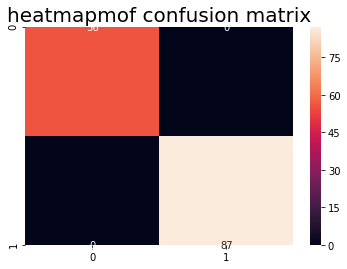

In [75]:
cm = confusion_matrix(Y_test, y_pred_xgb_pt)
plt.title("heatmapmof confusion matrix", fontsize = 20)
sb.heatmap(cm, annot=True)
plt.show()

In [81]:
confusion_matrix1= pd.crosstab(Y_test, y_pred_nb_MultinomialNB)
confusion_matrix1

col_0,0.0,1.0
Target_Output,,
0.0,46,10
1.0,3,84


# Type1(FP) error : 0 and Type2(FN) : 2
        
Type1 erorr is 10 (10 peopel do not have Breast Cancer, but model is telling, 10 have breast cancer) : it's fine

Type2 erorr is 3 (3 peopel have Breast Cancer, but model is telling, 3 do not have breast cancer) : it's problem

        
if Type2 error result will be 0, means model is best model
        
Note : Target : Type2(FN) must be near to 0



In [82]:
print(classification_report(Y_test, y_pred_nb_MultinomialNB))

              precision    recall  f1-score   support

         0.0       0.94      0.82      0.88        56
         1.0       0.89      0.97      0.93        87

    accuracy                           0.91       143
   macro avg       0.92      0.89      0.90       143
weighted avg       0.91      0.91      0.91       143



# Cross-validation of the ML model : To check model is overfit or underfit or perfect

    
Cross-validation mean score is almost equal to Model score (Means : perfect model) 

or esle overfitting (model score near to 1)

or else underfitting (difference will be more for Crpss_validation mean score and model score)

In [83]:
# Random Forest  Classifier with( criterion , n_estimators)
rf_classifier = RandomForestClassifier(criterion= "gini", n_estimators=20)
rf_classifier.fit(X_train, Y_train)
y_pred_nb = rf_classifier.predict(X_test)
Accuracy_Score = accuracy_score(Y_test, y_pred_nb)
print("Model Accuracy : ",Accuracy_Score)

cross_validation = cross_val_score(estimator=rf_classifier, X = X_train, y = Y_train, cv=10)

print("Cross validation accuracy of XGBoost model = ", cross_validation)
print("*"*120)
print("\nCross validation mean accuracy of XGBoost model = ", cross_validation.mean())
print("*"*120)

print("Cross_validation mean score = ", cross_validation.mean() , " and model score = ", Accuracy_Score)
print("both cv mean score is almost equal to model score : perfect model")

Model Accuracy :  0.9790209790209791
Cross validation accuracy of XGBoost model =  [1.         0.93023256 1.         1.         1.         0.97674419
 0.97619048 1.         0.97619048 1.        ]
************************************************************************************************************************

Cross validation mean accuracy of XGBoost model =  0.9859357696566999
************************************************************************************************************************
Cross_validation mean score =  0.9859357696566999  and model score =  0.9790209790209791
both cv mean score is almost equal to model score : perfect model


# Save the Machine Learning model(joblib is better than pickle)
After completion of the Machine Learning project or building the ML model need to deploy in an application. To deploy the ML model need to save it first. To save the Machine Learning project we can use the pickle or joblib package.

In [84]:
# save model in pickle format
pickle.dump(xgb_classifier_pt, open('breast_cancer_detector.pickle', 'wb'))
 
# load model
breast_cancer_detector_model = pickle.load(open('breast_cancer_detector.pickle', 'rb'))
 
# predict the output
y_pred = breast_cancer_detector_model.predict(X_test)
 
# confusion matrix
print('Confusion matrix of XGBoost model: \n',confusion_matrix(Y_test, y_pred),'\n')
 
# show the accuracy
print('Accuracy of XGBoost model = ',accuracy_score(Y_test, y_pred))

Confusion matrix of XGBoost model: 
 [[56  0]
 [ 0 87]] 

Accuracy of XGBoost model =  1.0


In [85]:
# save model in Joblib format
joblib.dump(xgb_classifier_pt, open('breast_cancer_detector.joblib', 'wb'))
 
# load model
breast_cancer_detector_model = joblib.load(open('breast_cancer_detector.joblib', 'rb'))
 
# predict the output
y_pred = breast_cancer_detector_model.predict(X_test)
 
# confusion matrix
print('Confusion matrix of XGBoost model: \n',confusion_matrix(Y_test, y_pred),'\n')
 
# show the accuracy
print('Accuracy of XGBoost model = ',accuracy_score(Y_test, y_pred))

Confusion matrix of XGBoost model: 
 [[56  0]
 [ 0 87]] 

Accuracy of XGBoost model =  1.0


In [86]:
from sklearn.metrics import confusion_matrix, f1_score, accuracy_score, roc_auc_score, roc_curve, classification_report
from sklearn.metrics import classification, precision_score, recall_score,explained_variance_score

In [87]:
# Train with Standard scaled Data
rf_classifier2 = RandomForestClassifier()
rf_classifier2.fit(X_train_sc, Y_train)
y_pred_nb_sc = rf_classifier2.predict(X_test_sc)



print("scaling : ", accuracy_score(Y_test, y_pred_nb_sc))

print("F1_Score : ",f1_score(Y_test, y_pred_nb_sc))

scaling :  0.9790209790209791
F1_Score :  0.9824561403508771


C:\Users\Rakesh Kumar\Anaconda3\lib\site-packages\sklearn\ensemble\forest.py:245: FutureWarning: The default value of n_estimators will change from 10 in version 0.20 to 100 in 0.22.
  "10 in version 0.20 to 100 in 0.22.", FutureWarning)


In [88]:
print("roc auc score : ",roc_auc_score(Y_test, y_pred_nb_sc))

roc auc score :  0.9827586206896552


In [89]:
print("roc curve : ",roc_curve(Y_test, y_pred_nb_sc))

roc curve :  (array([0., 0., 1.]), array([0.        , 0.96551724, 1.        ]), array([2., 1., 0.]))


In [90]:
print("classification : ",classification(Y_test, y_pred_nb_sc))

TypeError: 'module' object is not callable

In [91]:
print("classification_report : ",classification_report(Y_test, y_pred_nb_sc))

classification_report :                precision    recall  f1-score   support

         0.0       0.95      1.00      0.97        56
         1.0       1.00      0.97      0.98        87

    accuracy                           0.98       143
   macro avg       0.97      0.98      0.98       143
weighted avg       0.98      0.98      0.98       143



In [92]:
print("precision_score : ",precision_score(Y_test, y_pred_nb_sc))

precision_score :  1.0


In [93]:
print("recall_score : ",recall_score(Y_test, y_pred_nb_sc))

recall_score :  0.9655172413793104


In [94]:
print("explained_variance_score : ",explained_variance_score(Y_test, y_pred_nb_sc))

explained_variance_score :  0.9137931034482758
